In [11]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np

In [2]:
NULL_SUBCARRIERS = [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 64, 65, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127]

In [5]:
data = pd.read_csv("../training-data/Voxel-0/None-2024-04-11-14-31-53.csv")
data

,timestamp,rssi,csi,voxel_no,inter_voxel_no,activity
0,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 3, 12,...",0,0,NaN
1,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, -12...",0,0,NaN
2,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, -10, 8...",0,0,NaN
3,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, -2, -1...",0,0,NaN
4,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 6, 9, ...",0,0,NaN
...,...,...,...,...,...,...
330,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 10, -9...",0,0,NaN
331,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 10, 5,...",0,0,NaN
332,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, -10, -...",0,0,NaN
333,0,11,"[84, -64, 4, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 11,...",0,0,NaN


In [6]:
# Remove the values in the array in the first column in CSI_DF whose indexes are given in the NULL_SUBCARRIERS array
# Convert the 'csi' column to a list of lists, assuming each entry is a string representation of a list
csi_df = data['csi'].apply(lambda x: eval(x))

# Define a function to remove null subcarriers
def remove_null_subcarriers(csi_list):
    return [value for index, value in enumerate(csi_list) if index not in NULL_SUBCARRIERS]

# Apply the function to each row in the 'csi' column
csi_df = csi_df.apply(remove_null_subcarriers)
data['csi'] = csi_df
data

,timestamp,rssi,csi,voxel_no,inter_voxel_no,activity
0,0,11,"[3, 12, 3, 11, 3, 12, 2, 13, 2, 14, 1, 12, 1, ...",0,0,NaN
1,0,11,"[1, -12, 1, -13, 2, -13, 3, -13, 3, -14, 3, -1...",0,0,NaN
2,0,11,"[-10, 8, -8, 8, -10, 8, -10, 7, -10, 9, -12, 7...",0,0,NaN
3,0,11,"[-2, -12, -1, -12, -2, -13, 0, -14, 0, -14, 0,...",0,0,NaN
4,0,11,"[6, 9, 5, 10, 4, 10, 5, 12, 5, 12, 4, 12, 4, 1...",0,0,NaN
...,...,...,...,...,...,...
330,0,11,"[10, -9, 10, -10, 10, -9, 11, -9, 12, -10, 12,...",0,0,NaN
331,0,11,"[10, 5, 10, 5, 10, 6, 11, 7, 11, 8, 10, 7, 10,...",0,0,NaN
332,0,11,"[-10, -8, -10, -9, -10, -9, -10, -10, -10, -11...",0,0,NaN
333,0,11,"[1, 11, 2, 11, 1, 12, 0, 13, 0, 13, 0, 13, -1,...",0,0,NaN


In [13]:
csi_df = pd.DataFrame(csi_df)

,csi
0,"[3, 12, 3, 11, 3, 12, 2, 13, 2, 14, 1, 12, 1, ..."
1,"[1, -12, 1, -13, 2, -13, 3, -13, 3, -14, 3, -1..."
2,"[-10, 8, -8, 8, -10, 8, -10, 7, -10, 9, -12, 7..."
3,"[-2, -12, -1, -12, -2, -13, 0, -14, 0, -14, 0,..."
4,"[6, 9, 5, 10, 4, 10, 5, 12, 5, 12, 4, 12, 4, 1..."
...,...
330,"[10, -9, 10, -10, 10, -9, 11, -9, 12, -10, 12,..."
331,"[10, 5, 10, 5, 10, 6, 11, 7, 11, 8, 10, 7, 10,..."
332,"[-10, -8, -10, -9, -10, -9, -10, -10, -10, -11..."
333,"[1, 11, 2, 11, 1, 12, 0, 13, 0, 13, 0, 13, -1,..."


In [15]:
csi_df.iloc[0]

csi    [3, 12, 3, 11, 3, 12, 2, 13, 2, 14, 1, 12, 1, ...
Name: 0, dtype: object

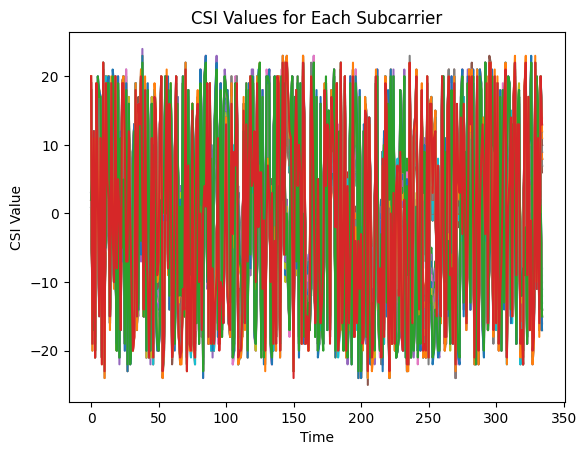

In [18]:
# Initialize a list to store values for each index
values_by_index = [[] for _ in range(104)]

# Iterate over each row of the dataframe
for index, row in csi_df.iterrows():
    subcarrier_values = row['csi']  # Replace 'csi' with the actual column name
    for i, value in enumerate(subcarrier_values):
        values_by_index[i].append(value)

# Plot values for each index
for i, values in enumerate(values_by_index):
    plt.plot(values, label=f'Subcarrier {i}')

# Add labels and legend
plt.xlabel('Time')
plt.ylabel('CSI Value')
plt.title('CSI Values for Each Subcarrier')

# Show plot
plt.show()

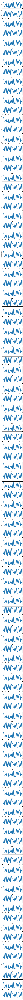

In [20]:
# Initialize a list to store values for each index
values_by_index = [[] for _ in range(104)]

# Iterate over each row of the dataframe
for index, row in csi_df.iterrows():
    subcarrier_values = row['csi']  # Replace 'csi' with the actual column name
    for i, value in enumerate(subcarrier_values):
        values_by_index[i].append(value)

# Plot values for each index in its own subplot
fig, axes = plt.subplots(nrows=104, ncols=1, figsize=(10, 104*4))  # Adjust the figure size as needed
for i, values in enumerate(values_by_index):
    axes[i].plot(values)
    axes[i].set_title(f'Subcarrier {i}')
    axes[i].set_xlabel('Time')
    axes[i].set_ylabel('CSI Value')

plt.tight_layout()  # Adjust subplots to fit into the figure area.
plt.show()